################################################################################################################################
#                  Mid Term: Author-Vaishali Lambe, NUID-001286444                            #
################################################################################################################################ 
# Question 1:

** Analysis 1 **
#### Zipf's Law on the body text from the Enron emails
################################################################################################################################

In [1]:
# Import the modules we need.
from bs4 import BeautifulSoup
from bs4 import SoupStrainer
import datetime
from glob import glob
import json
import nltk
from nltk import FreqDist
from nltk.corpus import gutenberg
from nltk.corpus import stopwords
import os
import re
import requests
import string
import sys
from timeit import default_timer as timer

# Path to the raw data.
raw_data_path = os.path.expanduser("~/midterm/data/enron/maildir")
print(raw_data_path)

# Path to the preprocessed data file (may or may not exist).
preprocessed_data_path = os.path.expanduser("~/midterm/data/enron/preprocessed_analysis1.json")
print(preprocessed_data_path)

# Check to see if the file is already there.
def have_preprocessed_data():
    return os.path.isfile(preprocessed_data_path)

print("Preprocessed data? " + str(have_preprocessed_data()))
    
# Make sure the stopwords corpus is available.
nltk.download('stopwords')

C:\Users\Admin/midterm/data/enron/maildir
C:\Users\Admin/midterm/data/enron/preprocessed_analysis1.json
Preprocessed data? True
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Admin\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [2]:
# Get a sample of documents from the Enron mail dump.
def get_enron_all_documents():
    
    # Save the working directory (for later restoration).
    saved_path = os.getcwd()
    print(saved_path)

    # Get the paths to the data files.
    # Use the "all_documents" directory as a sample of the entire corpus.
    os.chdir(raw_data_path)
    result = glob('**/all_documents/*')

    # Restore the working directory.
    os.chdir(saved_path)
    print(os.getcwd())
    
    print("found " + str(len(result)) + " files")
    print(result[0:20])

    return result

In [3]:
from nltk.corpus import PlaintextCorpusReader

#wordlists = PlaintextCorpusReader(data_path, enron_files)
#wordlists.fileids()

#corpus = nltk.Text(wordlists.words())
#print(type(corpus))

# Only consider tokens that consist entirely of letters to be valid words.
def is_valid_word(w):
    if w in string.punctuation:
        return False
    
    if not re.match(r'^[a-z]+$', w):
        return False
    
    return True

stopword_list = stopwords.words('english')
boring_words = ['com', 'x', 'cc', 'bcc', 'www', 'mime', 'aol', 'ascii', 'http', 'p', 'charset', 'date', 'content', 'type']
def is_interesting_word(w):
    if w in stopword_list:
        return False

    if w in boring_words:
        return False
    
    return True

#all_enron_words = wordlists.words()
#enron_words = list([w.lower() for w in all_enron_words 
#                    if is_valid_word(w.lower()) and is_interesting_word(w.lower())])
#print('First hundred interesting words in enron_words:')
#print(enron_words[0:100])

In [4]:
# Create the list of words from the raw data.
def create_enron_word_list():
    print("Reading words from the raw data")
    word_list = []
    file_counter = 0
    start = timer()
    enron_files = get_enron_all_documents()
    for fp in enron_files:
        # Print some output every 1000 files so we can see visible progress.
        file_counter += 1
        if file_counter == 1000:
            elapsed = timer()
            print(str(elapsed - start) + " - processing: " + fp)
            file_counter = 0
    
        lines = []
        with open(os.path.join(raw_data_path, fp), mode="rt", encoding="ISO-8859-1") as f:
            # There's a blank line between the headers and the body of the email.
            # Start in the headers.
            in_content = False
            for line in f:
                trimmed = line.strip()
                if in_content and trimmed != '':
                    lines.append(trimmed)

                if trimmed == '':
                    # Now we are in the body of the email.
                    in_content = True
        
        # Join the lines up to form a single long line, then tokenize it.
        raw = ' '.join(lines)
        tokens = nltk.wordpunct_tokenize(raw)
        text = nltk.Text(tokens)

        # Extract the words which are NOT stopwords.
        new_words = [w.lower() for w in text if is_valid_word(w.lower()) and (not w.lower() in stopword_list)]
        word_list.extend(new_words)

    end = timer()
    print("Finished after " + str(end - start) + " seconds.") 
    print("Read " + str(len(word_list)) + " files")
    return word_list

# Restore from the preprocessed data file.
def restore_enron_word_dict():
    print("Restoring from: " + preprocessed_data_path)
    
    result = {}
    with open(preprocessed_data_path, 'rt') as f:
        try:
            result = json.load(f)
        except ValueError:
            result = {}

    return result

# Save to the preprocessed data file.
def save_enron_word_dict(dict_to_save):
    # Save it to a file so we don't have to process the full email text again.
    print("Saving word counts dictionary to: " + preprocessed_data_path)
    with open(preprocessed_data_path, 'wt') as f:
        json.dump(dict_to_save, f)
        
# Count the frequency of words.
def count_words(word_list):  
    result = {}
    for w in word_list:
        if w not in result:
            result[w] = 1
        else:
            result[w] += 1

    return result

In [5]:
enron_word_counts = {}
if have_preprocessed_data():
    # Read enron_words from the preprocessed file.
    enron_word_counts = restore_enron_word_dict()

else:
    # Read the raw data.
    enron_words = create_enron_word_list()
    
    # Count frequency of words.
    enron_word_counts = count_words(enron_words)
    print(len(enron_word_counts))

    # Save to a preprocessed file for next time.
    save_enron_word_dict(enron_word_counts)
    
# Now enron_word_counts should exist.
print(len(enron_word_counts))
print(enron_word_counts)

Restoring from: C:\Users\Admin/midterm/data/enron/preprocessed_analysis1.json
202337
{'enronioadraft': 8, 'pocketed': 20, 'ile': 24, 'amazement': 48, 'forewarn': 4, 'localities': 22, 'energyventurefair': 20, 'hamburgische': 2, 'serfin': 4, 'qwwaaaad': 2, 'adyaaaaaap': 4, 'joncross': 4, 'zaz': 2, 'thisposting': 2, 'bonenvfdn': 2, 'rtellis': 76, 'missen': 2, 'foreword': 6, 'waabgayaabaaaaaap': 2, 'oeej': 2, 'remap': 10, 'easemen': 18, 'organizad': 2, 'imic': 2, 'grin': 38, 'demoralised': 8, 'wierded': 2, 'liberally': 30, 'buccigj': 2, 'breakups': 2, 'argos': 2, 'visiti': 2, 'dbcc': 6, 'sendouts': 4, 'quency': 2, 'unfolded': 30, 'olameter': 2, 'klimenko': 4, 'raschio': 8, 'blackcomb': 8, 'vinberg': 4, 'creater': 2, 'bwg': 2, 'co': 28696, 'bothered': 138, 'awioaaqabqazaa': 2, 'personnell': 10, 'counterflows': 14, 'musicne': 2, 'depos': 58, 'forecaste': 2, 'ilo': 28, 'hebenstreitb': 4, 'rgfhgxb': 2, 'penitentiaries': 2, 'restauran': 4, 'arensberg': 4, 'cbickers': 2, 'ctbt': 24, 'dgivens': 4

In [6]:
# Create NLTK frequency distribution object.
fd = FreqDist()

# For each token in the relevant text, increment its counter.
for key in enron_word_counts:
    fd[key] = enron_word_counts[key]

# Total number of samples.
print("Number of words: " + str(fd.N()))

# Number of unique words.
print("Unique words: " + str(fd.B()))

# Look at the top 20 words sorted by frequency.  Use a lambda function.
print("Most common words:")
common_words = map(lambda p: str(p[0]) + ' ' + str(p[1]), fd.most_common(20))
for cw in common_words:
    print(cw)

Number of words: 41247734
Unique words: 202337
Most common words:
enron 940662
ect 802004
com 650152
hou 397578
subject 218712
e 212052
please 193606
cc 185968
pm 185866
would 170826
power 170800
energy 157832
corp 149874
said 127956
mail 126174
new 124954
may 113710
ees 105600
california 105296
thanks 104812


In [7]:
# Create rank list and frequency list (without numpy or pandas) for the Zipf's law plot.
rank_list = []
frequency_list = []
rank = 0
for x in fd.most_common():
    word = x[0]
    count = x[1]
    rank += 1
    print("Word='" + word + "', Rank=" + str(rank) + ", Frequency=" + str(count))
    rank_list.append(rank)
    frequency_list.append(count)

print(rank_list[0:50])
print(frequency_list[0:50])

Word='enron', Rank=1, Frequency=940662
Word='ect', Rank=2, Frequency=802004
Word='com', Rank=3, Frequency=650152
Word='hou', Rank=4, Frequency=397578
Word='subject', Rank=5, Frequency=218712
Word='e', Rank=6, Frequency=212052
Word='please', Rank=7, Frequency=193606
Word='cc', Rank=8, Frequency=185968
Word='pm', Rank=9, Frequency=185866
Word='would', Rank=10, Frequency=170826
Word='power', Rank=11, Frequency=170800
Word='energy', Rank=12, Frequency=157832
Word='corp', Rank=13, Frequency=149874
Word='said', Rank=14, Frequency=127956
Word='mail', Rank=15, Frequency=126174
Word='new', Rank=16, Frequency=124954
Word='may', Rank=17, Frequency=113710
Word='ees', Rank=18, Frequency=105600
Word='california', Rank=19, Frequency=105296
Word='thanks', Rank=20, Frequency=104812
Word='time', Rank=21, Frequency=99110
Word='know', Rank=22, Frequency=99088
Word='gas', Rank=23, Frequency=97984
Word='state', Rank=24, Frequency=96400
Word='forwarded', Rank=25, Frequency=94874
Word='one', Rank=26, Frequenc

In [8]:
import matplotlib
import matplotlib.pyplot as plt

%matplotlib inline

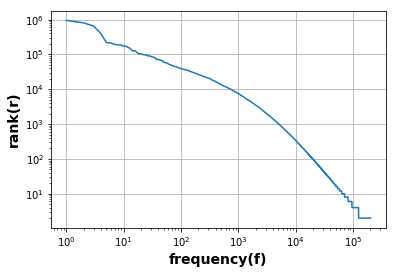

In [9]:
# Plot rank vs frequency on a log log plot and show the plot.
plt.loglog(rank_list, frequency_list)
plt.xlabel('frequency(f)', fontsize=14, fontweight='bold')
plt.ylabel('rank(r)', fontsize=14, fontweight='bold')
plt.grid(True)
plt.show()
